<a href="https://colab.research.google.com/github/LinaAlRifai/PV/blob/main/PVClass.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Import**

In [109]:
pip install --upgrade xgboost


In [110]:
!pip uninstall scikit-learn -y
!pip install scikit-learn==1.5.2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import binarize, LabelEncoder, MinMaxScaler
import re
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder, MultiLabelBinarizer
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense

Found existing installation: scikit-learn 1.5.2
Uninstalling scikit-learn-1.5.2:
  Successfully uninstalled scikit-learn-1.5.2
  Using cached scikit_learn-1.5.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (13 kB)
Using cached scikit_learn-1.5.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (13.3 MB)


**Merge AntiTNFDrugs1&AntiTNFDrugs2**

In [111]:
File1 = "AntiTNFDrugs1.xlsx"
File2 = "AntiTNFDrugs2.xlsx"
output_file = "BiosimilarAntiTNF.xlsx"
df1 = pd.read_excel(File1)
df2 = pd.read_excel(File2)
merged_df = pd.concat([df1, df2,], ignore_index=True)
merged_df.to_excel(output_file, index=False)
print(f"Files merged successfully into {output_file}")

Files merged successfully into BiosimilarAntiTNF.xlsx


**Read Data**

In [112]:
Biosimilar=pd.read_excel("BiosimilarAntiTNF.xlsx")
print(Biosimilar.head())
print(Biosimilar.shape)
print(Biosimilar.info())
print(Biosimilar.columns)

    Case ID                              Suspect Product Names  \
0  24380699  Stelara;Erelzi;Simponi;Sulfamethoxazole And Tr...   
1  24380614  Humira;Xeljanz;Erelzi;Butrans;Fosamax;Cimzia;M...   
2  24380182  Simponi;Cetirizine;Erelzi;Remicade;Orencia;Cim...   
3  24379633                                          Renflexis   
4  24379577                                          Renflexis   

                  Suspect Product Active Ingredients  \
0  Adalimumab;Mycophenolate Mofetil;Alendronate S...   
1  Secukinumab;Certolizumab Pegol;Leflunomide;Chl...   
2  Tocilizumab;Leflunomide;Alendronate Sodium;Pht...   
3                                    Infliximab-Abda   
4                                    Infliximab-Abda   

                                      Reason for Use  \
0  Arthritis;Product Used For Unknown Indication;...   
1  Migraine;Product Used For Unknown Indication;R...   
2  Product Used For Unknown Indication;Rheumatoid...   
3                                 Colitis 

In [113]:
Biosimilar = Biosimilar.drop(['Case ID', 'Event Date', 'Latest FDA Received Date','Patient Weight','Sender','Reporter Type', 'Report Source', 'Latest Manufacturer Received Date', 'Initial FDA Received Date',
      'Country where Event occurred','Reported to Manufacturer?','Manufacturer Control Number', 'Literature Reference','Concomitant Product Names','Compounded Flag'],axis=1)
print(Biosimilar.head())
print(Biosimilar.shape)
print(Biosimilar.columns)

                               Suspect Product Names  \
0  Stelara;Erelzi;Simponi;Sulfamethoxazole And Tr...   
1  Humira;Xeljanz;Erelzi;Butrans;Fosamax;Cimzia;M...   
2  Simponi;Cetirizine;Erelzi;Remicade;Orencia;Cim...   
3                                          Renflexis   
4                                          Renflexis   

                  Suspect Product Active Ingredients  \
0  Adalimumab;Mycophenolate Mofetil;Alendronate S...   
1  Secukinumab;Certolizumab Pegol;Leflunomide;Chl...   
2  Tocilizumab;Leflunomide;Alendronate Sodium;Pht...   
3                                    Infliximab-Abda   
4                                    Infliximab-Abda   

                                      Reason for Use  \
0  Arthritis;Product Used For Unknown Indication;...   
1  Migraine;Product Used For Unknown Indication;R...   
2  Product Used For Unknown Indication;Rheumatoid...   
3                                 Colitis Ulcerative   
4  Colitis Ulcerative;Product Used For Unknown

In [114]:
Biosimilar.isnull().sum()

,0
Suspect Product Names,0
Suspect Product Active Ingredients,0
Reason for Use,0
Reactions,0
Serious,0
Outcomes,0
Sex,0
Case Priority,0
Patient Age,0


In [115]:
Biosimilar.columns

Index(['Suspect Product Names', 'Suspect Product Active Ingredients',
       'Reason for Use', 'Reactions', 'Serious', 'Outcomes', 'Sex',
       'Case Priority', 'Patient Age'],
      dtype='object')

In [116]:
print(Biosimilar["Suspect Product Names"].unique())
print('-------------------------------------')
print(Biosimilar["Suspect Product Active Ingredients"].unique())
print('-------------------------------------')
print(Biosimilar["Reason for Use"].unique())
print('-------------------------------------')
print(Biosimilar["Reactions"].unique())
print('-------------------------------------')
print(Biosimilar["Serious"].unique())
print('-------------------------------------')
print(Biosimilar["Outcomes"].unique())
print('-------------------------------------')
print(Biosimilar["Sex"].unique())
print('-------------------------------------')
print(Biosimilar["Case Priority"].unique())
print('-------------------------------------')
print(Biosimilar["Patient Age"].unique())
print('-------------------------------------')
#print(Biosimilar["Concomitant Product Names"].unique())


['Stelara;Erelzi;Simponi;Sulfamethoxazole And Trimethoprim;Cimzia;Actemra;Emend;Remicade;Xeljanz;Orencia;Arava;Topicort;Enbrel;Cosentyx;Vitamin C;Cetirizine;Celebrex;Lyrica;Otezla;Chloraprep;Humira'
 'Humira;Xeljanz;Erelzi;Butrans;Fosamax;Cimzia;Minocycline;Remicade;Orencia;Berinert;Enbrel;Vitamin C;Simponi;Myochrysine;Atomoxetine;Stelara;Actemra;Lamictal;Myrbetriq;Aimovig;Nucala;Arava;Cosentyx'
 'Simponi;Cetirizine;Erelzi;Remicade;Orencia;Cimzia;Actemra' ...
 'Xeljanz;Amjevita' 'Purinethol;Hulio;Humira' 'Purinethol;Hulio']
-------------------------------------
['Adalimumab;Mycophenolate Mofetil;Alendronate Sodium;Cortisone Acetate;Chlorhexidine Gluconate\\Isopropyl Alcohol;Rituximab;Hydroxychloroquine;Apremilast;Diclofenac Sodium;Infliximab;Dietary Supplement\\Herbals;Pregabalin;Chlorhexidine;Celecoxib;Cetirizine Hydrochloride;Cholecalciferol;Secukinumab;Ascorbic Acid;Etanercept;Leflunomide;Methotrexate;Desoximetasone;Cetirizine Hydrochloride;Pantoprazole;Cetirizine Hydrochloride\\Pse

In [117]:
#Age
#-1 year replace with mode value
print(Biosimilar[Biosimilar['Patient Age']=='-1 YR'].value_counts())
mode_age = Biosimilar['Patient Age'].mode()[0]
Biosimilar['Patient Age'] = Biosimilar['Patient Age'].replace('-1 yr', mode_age)
Biosimilar.head()
#Drop DEC
strings_to_match = ['3 DEC','4 DEC', '2 DEC','5 DEC','6 DEC', '7 DEC','8 DEC' ]
rows_to_drop = Biosimilar[Biosimilar['Patient Age'].isin(strings_to_match)].index
Biosimilar = Biosimilar.drop(rows_to_drop)
print(Biosimilar['Patient Age'].unique())
#standerize the age (year for all)
def process_age(age):
    try:
        if 'YR' in age:
            return int(age.split()[0])
        elif 'MTH' in age:  # Convert months to years
            return round(int(age.split()[0]) / 12, 2)
        elif 'DAY' in age:  # Convert days to years
            return round(int(age.split()[0]) / 365, 2)
        elif 'WEEK' in age:  # Convert weeks to years
            return round(int(age.split()[0]) / 52, 2)
        else:
            return np.nan  # For "Not Specified" or other invalid values
    except:
        return np.nan

Biosimilar['Processed Age'] = Biosimilar['Patient Age'].apply(process_age)
print('Processed Age')
print(Biosimilar['Processed Age'].unique())
# Apply the function to clean the age column
Biosimilar['Processed Age'] = Biosimilar['Patient Age'].apply(process_age)
Biosimilar.head()
# Categorize ages using pd.cut
#Biosimilar['Age Range'] = pd.cut(
   #Biosimilar['Processed Age'],
    #[0, 20, 30, 65, 100],
    #labels=["0-3", "3-11", "11-17", "17"],
    #include_lowest=True)
#Replase NAN with the mean
mean_age = Biosimilar['Processed Age'].mean()
Biosimilar['Processed Age'].fillna(mean_age, inplace=True)
print('final Processed Age')
print(Biosimilar['Processed Age'].unique())

Suspect Product Names  Suspect Product Active Ingredients  Reason for Use                                             Reactions                                                                                                                                                                                                                              Serious  Outcomes        Sex     Case Priority  Patient Age
Erelzi                 Etanercept-Szzs;Methotrexate        Product Used For Unknown Indication;Psoriatic Arthropathy  Urinary Tract Infection;Hypoacusis;Injection Site Pain;Diarrhoea;Groin Pain;Fall;Arthralgia;Neuralgia;Neoplasm;Electric Shock Sensation;Covid-19;Abdominal Pain;Dizziness;Cataract;Periarthritis;Nausea;Deafness;Labyrinthitis;Nodule  Serious  Other Outcomes  Female  Expedited      -1 YR          1
Name: count, dtype: int64
['44 YR' '40 YR' 'Not Specified' '9 YR' '54 YR' '79 YR' '43 YR' '72 YR'
 '3 YR' '61 YR' '66 YR' '65 YR' '37 YR' '48 YR' '45 YR' '59 YR' '53 YR'
 '46 YR

<ipython-input-117-808c40c3b342>:42: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  Biosimilar['Processed Age'].fillna(mean_age, inplace=True)


In [118]:
#Sex
print('sex')
print(Biosimilar['Sex'].value_counts())
Biosimilar['Sex'] = Biosimilar['Sex'].replace('Not Specified', np.nan)
Biosimilar['Sex'].fillna(method='ffill', inplace=True)
print('after cleaning')
print(Biosimilar['Sex'].value_counts())

sex
Sex
Not Specified    21850
Female            8986
Male              3386
Name: count, dtype: int64
after cleaning
Sex
Female    25091
Male       9131
Name: count, dtype: int64


<ipython-input-118-038098c32bde>:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  Biosimilar['Sex'].fillna(method='ffill', inplace=True)
<ipython-input-118-038098c32bde>:5: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  Biosimilar['Sex'].fillna(method='ffill', inplace=True)


In [119]:
#Suspect Product Active Ingredients
SPAI=Biosimilar['Suspect Product Active Ingredients']
drugs = {
    "Adalimumab", "Adalimumab-Fkjp", "Adalimumab-FKJP", "Adalimumab-RYVK",
    "Adalimumab-DWWD", "Adalimumab-ATTO", "Adalimumab-Atto", "Adalimumab-Aqvh",
    "Adalimumab-AQVH", "Infliximab", "Infliximab-Abda", "Infliximab-AXXQ","Infliximab-Qbtx",
    "Infliximab-DYYB", "Adalimumab-Bwwd","Infliximab-QBTX", "Etanercept-Szzs","Adalimumab-Fkjp","Infliximab-Dyyb","Adalimumab-Ryvk","Adalimumab-Dwwd","Infliximab-Axxq"
}

def clean_and_filter(SPAI, drugs):
    result = []
    for entry in SPAI:

        items = re.split(r';|\\', entry)

        filtered_items = [item for item in items if item in drugs]
        result.append(filtered_items)
    return result
filtered_data = clean_and_filter(SPAI, drugs)
filtered_data_str = ["|".join(item) if item else np.nan for item in filtered_data]
Biosimilar['Name of Biosimilar Drugs'] = filtered_data_str
for i, entry in enumerate(filtered_data_str, 1):
    print(f"Entry {i}: {entry}")
print(Biosimilar.head())


def clean_and_filter(SPAI, drugs):
    result = []
    for entry in SPAI:

        items = re.split(r';|\\', entry)

        filtered_items = [item for item in items if item in drugs]
        result.append(filtered_items)
    return result
filtered_data = clean_and_filter(SPAI,drugs)
filtered_data_str = ["|".join(item) if item else np.nan for item in filtered_data]
Biosimilar['Name of Biosimilar Drugs'] = filtered_data_str
for i, entry in enumerate(filtered_data_str, 1):
    print(f"Entry {i}: {entry}")
print(Biosimilar.head())

Streaming output truncated to the last 5000 lines.
Entry 29271: Infliximab-Dyyb
Entry 29272: Infliximab-Dyyb
Entry 29273: Infliximab-Dyyb
Entry 29274: Infliximab-Dyyb
Entry 29275: Infliximab-Dyyb
Entry 29276: Infliximab-Dyyb
Entry 29277: Infliximab-Dyyb
Entry 29278: Infliximab-Dyyb
Entry 29279: Infliximab-Dyyb
Entry 29280: Infliximab-Dyyb
Entry 29281: Infliximab-Dyyb
Entry 29282: Infliximab-Dyyb
Entry 29283: Infliximab-Dyyb|Adalimumab
Entry 29284: Infliximab-Dyyb
Entry 29285: Infliximab-Dyyb
Entry 29286: Infliximab-Dyyb
Entry 29287: Infliximab-Dyyb
Entry 29288: Infliximab-Dyyb
Entry 29289: Infliximab-Dyyb
Entry 29290: Infliximab-Dyyb
Entry 29291: Infliximab-Dyyb
Entry 29292: Infliximab-Dyyb
Entry 29293: Infliximab-Dyyb
Entry 29294: Infliximab-Dyyb
Entry 29295: Etanercept-Szzs
Entry 29296: Infliximab-Dyyb
Entry 29297: Infliximab-Dyyb
Entry 29298: Infliximab-Dyyb
Entry 29299: Infliximab-Dyyb
Entry 29300: Infliximab-Dyyb
Entry 29301: Infliximab-Dyyb
Entry 29302: Infliximab-Dyyb
Entry 2930

In [120]:
#reaction
RANTITNF = Biosimilar['Reactions']
disorders = {
    "Injury, Poisoning","Procedural Complications",
    "General Disorders","Administration Site Conditions",
    "Gastrointestinal Disorders",
    "Musculoskeletal","Connective Tissue Disorders",
    "Infections","Infestations",
    "Nervous System Disorders",
    "Skin","Subcutaneous Tissue Disorders",
    "Surgical","Medical Procedures",
    "Investigations",
    "Respiratory", "Thoracic", "Mediastinal Disorders",
    "Psychiatric Disorders",
    "Product Issues",
    "Neoplasms Benign","Malignant And Unspecified (Incl Cysts And Polyps)",
    "Eye Disorders",
    "Cardiac Disorders",
    "Vascular Disorders",
    "Metabolism","Nutrition Disorders",
    "Renal","Urinary Disorders",
    "Immune System Disorders",
    "Social Circumstances",
    "Blood","Lymphatic System Disorders",
    "Ear","Labyrinth Disorders",
    "Hepatobiliary Disorders",
    "Pregnancy","Puerperium","Perinatal Conditions",
    "Reproductive System", "Breast Disorders",
    "Endocrine Disorders",
    "Congenital", "Familial And Genetic Disorders","Paraesthesia", "Peripheral Venous Disease", "Off Label Use", "Product Quality Issue",
  "Intentional Product Use Issue", "Obesity", "Wound Infection", "Gait Inability",
  "Urticaria", "Wheezing", "Osteoarthritis", "Stomatitis", "Weight Increased",
  "Taste Disorder", "Peripheral Swelling", "Back Injury", "Drug Ineffective",
  "Glossodynia", "Product Use Issue", "Alopecia", "Abdominal Discomfort", "Pemphigus",
  "Pain", "Systemic Lupus Erythematosus", "Maternal Exposure During Pregnancy",
  "Contraindicated Product Administered", "Rheumatoid Arthritis", "Haematochezia",
  "Osteonecrosis", "Illness", "Lower Respiratory Tract Infection", "Anxiety",
  "Joint Injury", "Anaphylactic Reaction", "Dementia", "Pulmonary Mass",
  "Inguinal Hernia", "Productive Cough", "Malaise", "Lethargy", "Fibromyalgia",
  "Hypoaesthesia", "Diarrhoea", "Arthralgia", "Abdominal Pain Upper",
  "Discomfort", "Anti-Cyclic Citrullinated Peptide Antibody Positive",
  "Maternal Exposure Timing Unspecified", "Insomnia", "Dizziness",
  "Exposure During Pregnancy", "Adverse Event", "Breast Cancer Stage III",
  "Drug Hypersensitivity", "Abdominal Pain", "General Physical Health Deterioration",
  "Arthropathy", "Live Birth", "Adverse Drug Reaction", "Blister", "Fatigue",
  "Condition Aggravated", "Duodenal Ulcer Perforation", "Nasal Congestion",
  "Anorectal Operation", "Flushing", "Erythema", "Pyrexia", "Arthritis",
  "Intestinal Perforation", "Disorientation", "Urinary Tract Infection",
  "White Blood Cell Count Increased", "Paralysis", "Anaemia", "Adhesion",
  "Dyspnoea", "Erythema Nodosum", "Cough", "Drug Specific Antibody Present",
  "Inappropriate Schedule Of Product Administration", "Flatulence", "Hepatic Fibrosis",
  "Transaminases Increased", "Hepatic Steatosis", "Fistula", "Pulmonary Embolism",
  "Bone Erosion", "Bronchitis", "Infection", "Breast Cancer Stage I", "Injury",
  "Helicobacter Infection", "C-Reactive Protein Increased", "Amnesia",
  "Hepatic Enzyme Increased", "Dislocation Of Vertebra", "Hypertension", "Dyspepsia",
  "Confusional State", "Delirium", "Hepatic Cirrhosis", "Hypersensitivity",
  "Gait Disturbance", "Ear Infection", "Deep Vein Thrombosis Postoperative", "Asthma",
  "Depression", "Contusion", "Exostosis", "Foot Deformity", "Adjustment Disorder With Depressed Mood",
  "Folliculitis", "Hand Deformity", "Chest Pain", "Grip Strength Decreased",
  "Decreased Appetite", "Impaired Healing", "Drug-Induced Liver Injury", "Headache",
  "Crohn's Disease", "Anti-Cyclic Citrullinated Peptide Antibody", "Blood Cholesterol Increased",
  "Incorrect Product Administration Duration", "Therapeutic Response Shortened",
  "Angina Pectoris", "Vomiting", "Hip Fracture", "Renal Failure", "Angioedema",
  "Herpes Zoster", "Neck Pain", "Mouth Ulceration", "Eye Ulcer", "Foot Fracture",
  "Haemorrhage", "Deep Vein Thrombosis", "Gastroenteritis Viral", "Blood Pressure Diastolic Decreased",
  "Pancreastatin Increased", "Food Intolerance", "Facial Operation",
  "Dermatitis Allergic", "Infusion Site Haemorrhage", "Therapeutic Product Effect Decreased",
  "Muscle Injury", "Facet Joint Syndrome", "Infusion Related Reaction", "Lower Limb Fracture",
  "Musculoskeletal Stiffness", "Psoriatic Arthropathy", "Adjustment Disorder With Depressed Mood",
  "Ill-Defined Disorder", "Rheumatic Fever", "Ulcer Haemorrhage", "Therapy Non-Responder",
  "Condition Aggravated", "Arthralgia", "Abdominal Distension", "Drug Specific Antibody Present",
  "Proctalgia", "Petit Mal Epilepsy", "Seizure", "Viral Infection", "Fall",
  "Head Injury", "Gastrointestinal Infection", "Sleep Disorder Due To A General Medical Condition",
  "Ankle Fracture", "Behcet's Syndrome", "Gastrointestinal Haemorrhage",
  "Genital Herpes", "Fungal Skin Infection", "Oral Candidiasis",
  "Faecal Calprotectin Increased", "Drug Level Below Therapeutic",
  "Drug Level Decreased", "Anal Fissure", "Lymphadenopathy", "Pyoderma Gangrenosum",
  "Tachycardia", "Toothache", "Ear Infection Bacterial", "Constipation",
  "Disease Recurrence", "Tooth Infection", "Somnolence", "Drug Level Above Therapeutic","Juvenile Idiopathic Arthritis", "Off Label Use", "Weight Bearing Difficulty", "Drug Ineffective", "Therapeutic Response Shortened", "Headache", "Flank Pain", "Malaise", "Impaired Work Ability", "Neck Pain", "Condition Aggravated", "Urinary Tract Infection", "Pain In Extremity", "Inappropriate Schedule Of Product Administration", "Nocturia", "Stress", "Renal Pain", "Fatigue", "Back Pain", "Intentional Product Use Issue", "Infection"




}

def clean_and_filter(RANTITNF,disorders):
    result = []
    for entry in RANTITNF:

        items = re.split(r';|\\', entry)

        filtered_items = [item for item in items if item in disorders]
        result.append(filtered_items)
    return result
filtered_data = clean_and_filter(RANTITNF, disorders)
filtered_data_str = ["|".join(item) if item else np.nan for item in filtered_data]
Biosimilar['Reaction of Biosimilar Drugs'] = filtered_data_str
for i, entry in enumerate(filtered_data_str, 1):
    print(f"Entry {i}: {entry}")
print(Biosimilar.head())


def clean_and_filter(RANTITNF, disorders):
    result = []
    for entry in RANTITNF:

        items = re.split(r';|\\', entry)

        filtered_items = [item for item in items if item in disorders]
        result.append(filtered_items)
    return result
filtered_data = clean_and_filter(RANTITNF,disorders)
filtered_data_str = ["|".join(item) if item else np.nan for item in filtered_data]
Biosimilar['Reaction of Biosimilar Drugs'] = filtered_data_str
for i, entry in enumerate(filtered_data_str, 1):
    print(f"Entry {i}: {entry}")
print(Biosimilar.head())



Streaming output truncated to the last 5000 lines.
Entry 29278: Hypertension
Entry 29279: Incorrect Product Administration Duration|Diarrhoea|Headache|Flushing|Fatigue|Drug Ineffective|Urticaria|Chest Pain|Drug Hypersensitivity|Cough|Infusion Related Reaction
Entry 29280: Insomnia
Entry 29281: Arthralgia
Entry 29282: Pain|Back Pain|Urinary Tract Infection|Diarrhoea|Vomiting
Entry 29283: Folliculitis
Entry 29284: Malaise
Entry 29285: Hypertension
Entry 29286: Hypertension|Lethargy
Entry 29287: Headache|Somnolence|Abdominal Discomfort
Entry 29288: Infusion Related Reaction|Dizziness|Tachycardia|Flushing
Entry 29289: Peripheral Swelling|Illness|Infection|Pain In Extremity|Urinary Tract Infection
Entry 29290: Off Label Use|Drug Ineffective|C-Reactive Protein Increased|White Blood Cell Count Increased
Entry 29291: Arthralgia|Drug Ineffective
Entry 29292: Somnolence|Arthropathy|Pain In Extremity|Insomnia|Musculoskeletal Stiffness|Arthralgia
Entry 29293: Hepatic Enzyme Increased|Malaise
Entry

In [121]:
Biosimilar[Biosimilar["Reaction of Biosimilar Drugs"].isnull()]

,Suspect Product Names,Suspect Product Active Ingredients,Reason for Use,Reactions,Serious,Outcomes,Sex,Case Priority,Patient Age,Processed Age,Name of Biosimilar Drugs,Reaction of Biosimilar Drugs
35,Inflectra,Infliximab-Dyyb,Colitis Ulcerative,Ear Neoplasm Malignant,Serious,Other Outcomes,Male,Expedited,Not Specified,51.067563,Infliximab-Dyyb,NaN
36,Inflectra,Infliximab-Dyyb,Colitis Ulcerative,Pulmonary Oedema;Chronic Obstructive Pulmonary...,Serious,Hospitalized;Other Outcomes,Male,Expedited,Not Specified,51.067563,Infliximab-Dyyb,NaN
38,Inflectra,Infliximab-Dyyb,Crohn's Disease,Blood Pressure Increased;Blood Pressure Fluctu...,Serious,Other Outcomes,Male,Expedited,Not Specified,51.067563,Infliximab-Dyyb,NaN
108,Inflectra,Infliximab-Dyyb,-,Death,Serious,Died;Other Outcomes,Female,Expedited,Not Specified,51.067563,Infliximab-Dyyb,NaN
111,Inflectra,Infliximab-Dyyb,Product Used For Unknown Indication,Chronic Recurrent Multifocal Osteomyelitis,Serious,Other Outcomes,Female,Expedited,Not Specified,51.067563,Infliximab-Dyyb,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
34235,Purinethol;Hulio;Humira,Adalimumab;Adalimumab-Fkjp;Mercaptopurine,Crohn's Disease;Vitamin B12 Deficiency;Vitamin...,Invasive Breast Carcinoma,Serious,Life Threatening;Other Outcomes,Female,Expedited,47 YR,47.000000,Adalimumab|Adalimumab-Fkjp,NaN
34236,Humira;Hulio,Adalimumab-Fkjp;Adalimumab,Product Used For Unknown Indication;Psoriatic ...,Nephrotic Syndrome,Serious,Hospitalized,Male,Expedited,67 YR,67.000000,Adalimumab-Fkjp|Adalimumab,NaN
34237,Purinethol;Hulio,Adalimumab-Fkjp;Mercaptopurine;Adalimumab,Crohn's Disease;Vitamin B12 Deficiency;Vitamin...,Invasive Breast Carcinoma,Serious,Life Threatening;Other Outcomes,Female,Non-Expedited,Not Specified,51.067563,Adalimumab-Fkjp|Adalimumab,NaN
34241,Humira;Amjevita,Adalimumab-Atto;Adalimumab,Inflammatory Bowel Disease;Product Used For Un...,Renal Impairment,Serious,Other Outcomes,Male,Expedited,9 YR,9.000000,Adalimumab-Atto|Adalimumab,NaN


In [122]:
#Reason for Use
RFU=Biosimilar['Reason for Use']
Reason = {
    "Arthritis", "Spondylitis", "Colitis", "Rheumatoid Arthritis", "Colectomy", "Crohn's Disease",
    "Psoriatic Arthropathy", "Uveitis", "Crohn's Disease", "Ankylosing Spondylitis", "Hidradenitis",
    "Pyoderma Gangrenosum", "Product Used For Unknown Indication", "Arthritis Reactive", "Gastrointestinal Inflammation",
    "Autoimmune Uveitis", "Still's Disease", "Liver Sarcoidosis", "Renal Failure", "Sarcoidosis Of Lymph Node",
    "X-Linked Lymphoproliferative Syndrome", "Spondyloarthropathy", "Colitis Microscopic", "Spinal Osteoarthritis",
    "Osteopathic Treatment", "Rheumatic Disorder", "Granuloma Annulare", "Polyarthritis", "Polyneuropathy",
    "Takayasu's Arteritis", "Cardiac Sarcoidosis", "Juvenile Spondyloarthritis", "Chorioretinitis", "Still's Disease ",
    "Cerebrovascular Accident", "Migraine", "Corneal Implant", "Iron Deficiency Anaemia", "Juvenile Idiopathic Arthritis",
    "Cellulitis", "Idiopathic Pulmonary Fibrosis", "-", "Sarcoidosis", "Proctitis Ulcerative", "Eosinophilic Oesophagitis",
    "Abdominal Pain", "Back Pain", "Enema Administration", "Eczema", "Autoimmune Disorder", "Osteomyelitis Chronic",
    "Colitis Ulcerative", "'-", "Premedication", "Neurosarcoidosis", "Osteoarthritis", "Sacroiliitis", "Psoriasis",
    "Axial Spondyloarthritis", "Autoimmune Enteropathy", "Noninfective Chorioretinitis", "Arteritis", "Gastrointestinal Disorder",
    "Maternal Exposure Timing Unspecified", "Erythrodermic Psoriasis", "Fistula Of Small Intestine", "Osteomyelitis",
    "Cystoid Macular Oedema", "Visual Impairment", "Gastrointestinal Toxicity", "Retinal Vasculitis", "Pyoderma", "Sedation",
    "Sedation", "Adverse Drug Reaction", "Sapho Syndrome", "Anaemia;Medication Dilution", "Blindness", "Skin Infection",
    "Scleritis", "Cyclitis", "Gastroenteritis", "Acute Haemorrhagic Ulcerative Colitis", "Pericarditis", "Arthropathy",
    "Foetal Exposure During Pregnancy", "Polychondritis", "Alopecia Scarring", "Myositis", "Dermatitis", "Orofacial Granulomatosis",
    "Iridocyclitis", "Malignant Melanoma", "Cholangitis", "Multiple Sclerosis", "Blood Glucose", "Metastatic Renal Cell Carcinoma",
    "Liver Function Test Increased", "Skin Disorder", "Connective Tissue Disorder", "Enteritis", "Pain", "Hepatic Cirrhosis",
    "Cholangitis Sclerosing", "Fibromyalgia", "Immunoglobulin G4 Related Disease", "Chorioretinal Disorder", "Monoclonal Gammopathy",
    "Anterior Spinal Artery Syndrome", "Polymyositis", "Growth Hormone Deficiency", "Sympathetic Ophthalmia", "Autoimmune Hepatitis",
    "Polyarteritis Nodosa", "Meningitis", "Chronic Graft Versus Host Disease", "Immune-Mediated Gastritis", "Anal Haemorrhage",
    "Rectal Haemorrhage", "Autoimmune Colitis", "Chronic Graft Versus Host Disease", "Acute Generalised Exanthematous Pustulosis",
    "Covid-19 Immunisation", "Acute Graft Versus Host Disease", "Hypertension", "Eosinophilic Colitis", "Proctitis", "Retroperitoneal Fibrosis",
    "Acute Graft Versus Host Disease", "Renal Tubular Injury", "Tubulointerstitial Nephritis", "Cronkhite-Canada Syndrome",
    "Mesenteric Panniculitis", "Eye Discharge", "Rash", "Rhinorrhoea", "Furuncle", "Drug Eruption", "Gastrointestinal Bacterial Infection",
    "Vogt-Koyanagi-Harada Disease", "Lung Disorder", "Microscopic Polyangiitis", "Immunodeficiency", "Orbital Myositis",
    "Chronic Obstructive Pulmonary Disease", "Dyspnoea", "Atrial Fibrillation", "Carotid Artery Occlusion", "Immunosuppressant Drug Therapy",
    "Rheumatoid Arthritis", "Cranial Nerve Disorder", "Inappropriate Antidiuretic Hormone Secretion", "Intracranial Mass",
    "VIth Nerve Paralysis", "Dermatitis Infected", "Mucosal Erosion", "Multisystem Inflammatory Syndrome", "Product Used For Unknown Indication",
    "Mucocutaneous Rash", "Mucosal Inflammation", "Stomatitis", "Mucocutaneous Disorder", "Multisystem Inflammatory Syndrome In Children",
    "Intestinal Stenosis", "Large Intestine Anastomosis", "Neutrophilic Dermatosis", "Idiopathic Orbital Inflammation", "Graft Versus Host Disease",
    "Stem Cell Transplant", "Bronchitis Chronic", "Cough", "Dysphonia", "Cogan's Syndrome", "Rheumatoid Vasculitis", "Pityriasis Rubra Pilaris",
    "Clostridium Difficile Colitis", "Hypercoagulation", "Gastritis", "Cogan's Syndrome", "Vitamin D Deficiency", "Graft Versus Host Disease;Stem Cell Transplant",
    "Supplementation Therapy", "Metastatic Malignant Melanoma", "Hormone Replacement Therapy", "Lung Carcinoma Cell Type Unspecified Stage 0",
    "Diarrhoea", "Blau Syndrome", "Keratitis Interstitial", "Pancreatitis", "Drug Therapy", "Vascular Access Complication", "Immune-Mediated Enterocolitis",
    "Chronic Disease", "Erectile Dysfunction", "Anorectal Disorder", "Intrauterine Contraception", "Pneumonitis", "Abscess", "Immunosuppression",
    "Gastrooesophageal Reflux Disease", "Sjogren's Syndrome", "Pruritus", "Vaginal Disorder", "Complex Regional Pain Syndrome",
    "Pyogenic Sterile Arthritis Pyoderma Gangrenosum And Acne Syndrome", "Arthralgia", "Temporomandibular Pain And Dysfunction Syndrome",
    "Therapy Cessation", "Lung Neoplasm Malignant", "Intestinal Mass", "Subcutaneous Abscess", "Off Label Use", "Granulomatosis With Polyangiitis",
    "Arthritis Enteropathic", "Iron Deficiency", "Product Use In Unapproved Indication", "Colon Cancer", "Neutropenia", "Cutaneous Sarcoidosis",
    "Irritable Bowel Syndrome", "Behcet's Syndrome", "Inflammatory Bowel Disease", "Palmoplantar Pustulosis", "Vasculitis", "Dermatitis Atopic",
    "Fistula", "Rheumatic Fever", "Myocarditis", "Medication Dilution", "Anaemia", "Medication Dilution", "Pustular Psoriasis", "Seronegative Arthritis",
    "Prophylaxis", "Pulmonary Sarcoidosis", "Birdshot Chorioretinopathy", "Prostatic Specific Antigen", "Tuberculosis", "Tendonitis", "Aphthous Ulcer",
    "Anticoagulant Therapy", "Exposure During Pregnancy", "Pouchitis"

}


def clean_and_filter(RFU, Reason):
    result = []
    for entry in RFU:

        items = re.split(r';|\\', entry)

        filtered_items = [item for item in items if item in Reason]
        result.append(filtered_items)
    return result
filtered_data = clean_and_filter(RFU, drugs)
filtered_data_str = ["|".join(item) if item else np.nan for item in filtered_data]
Biosimilar['Reason for Useing Biosimilar'] = filtered_data_str
for i, entry in enumerate(filtered_data_str, 1):
    print(f"Entry {i}: {entry}")
print(Biosimilar.head())


def clean_and_filter(RFU,Reason ):
    result = []
    for entry in RFU:

        items = re.split(r';|\\', entry)

        filtered_items = [item for item in items if item in Reason ]
        result.append(filtered_items)
    return result
filtered_data = clean_and_filter(RFU,Reason)
filtered_data_str = ["|".join(item) if item else np.nan for item in filtered_data]
Biosimilar['Reason for Useing Biosimilar'] = filtered_data_str
for i, entry in enumerate(filtered_data_str, 1):
    print(f"Entry {i}: {entry}")
print(Biosimilar.head())
# convert some of term
def replace_rh_with_rhematid(column_data):
    column_data_list = column_data.tolist()

    for i in range(len(column_data_list)):
        if isinstance(column_data_list[i], str):
            if 'Arthritis ' in column_data_list[i]:
                column_data_list[i] = column_data_list[i].replace('Arthritis ', 'Rheumatoid Arthritis ')
            elif 'Colitis Ulcerative' in column_data_list[i]:
                column_data_list[i] = column_data_list[i].replace('Colitis Ulcerative', 'Colitis')
            elif 'Product Used For Unknown Indication' in column_data_list[i] or \
                 'Product Use In Unapproved Indication' in column_data_list[i] or \
                 'Premedication' in column_data_list[i] or \
                 'Off Label Use' in column_data_list[i]:
                column_data_list[i] = column_data_list[i].replace(column_data_list[i], 'Treatment-Related')

    return pd.Series(column_data_list)

column_data = Biosimilar['Reason for Useing Biosimilar']

updated_column_data = replace_rh_with_rhematid(column_data)

print(updated_column_data)



Streaming output truncated to the last 5000 lines.
Entry 29297: Product Used For Unknown Indication|Psoriatic Arthropathy
Entry 29298: Colitis Ulcerative
Entry 29299: Crohn's Disease
Entry 29300: Rheumatoid Arthritis
Entry 29301: Crohn's Disease
Entry 29302: Product Used For Unknown Indication|Rheumatoid Arthritis
Entry 29303: Colitis Ulcerative|Product Used For Unknown Indication
Entry 29304: Rheumatoid Arthritis
Entry 29305: Colitis Ulcerative
Entry 29306: Product Used For Unknown Indication|Rheumatoid Arthritis
Entry 29307: Psoriatic Arthropathy
Entry 29308: Rheumatoid Arthritis
Entry 29309: Rheumatoid Arthritis
Entry 29310: Rheumatoid Arthritis
Entry 29311: Crohn's Disease
Entry 29312: Colitis Ulcerative
Entry 29313: Ankylosing Spondylitis
Entry 29314: Ankylosing Spondylitis
Entry 29315: Product Used For Unknown Indication|Rheumatoid Arthritis
Entry 29316: Ankylosing Spondylitis
Entry 29317: Crohn's Disease
Entry 29318: Crohn's Disease|Product Used For Unknown Indication
Entry 2931

In [123]:
Biosimilar= Biosimilar.drop(["Suspect Product Names","Reason for Use","Suspect Product Active Ingredients"], axis=1)

In [124]:
labelDict = {}
for feature in Biosimilar:
    le = preprocessing.LabelEncoder()
    le.fit(Biosimilar[feature])
    le_name_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
    Biosimilar[feature] = le.transform(Biosimilar[feature])
    # Get labels
    labelKey = 'label_' + feature
    labelValue = [*le_name_mapping]
    labelDict[labelKey] =labelValue
for key, value in labelDict.items():
    print(key, value)
Biosimilar.head()

label_Reactions ['Abdominal Discomfort', "Abdominal Discomfort;Abdominal Distension;Crohn's Disease;Drug Ineffective;Lower Respiratory Tract Infection;Hepatomegaly;Off Label Use", 'Abdominal Discomfort;Abdominal Pain;Faeces Discoloured;Injection Site Reaction;Product Dose Omission Issue;Angina Pectoris;Diarrhoea;Hypersensitivity', 'Abdominal Discomfort;Abdominal Pain;Underdose;Eating Disorder;Malaise', 'Abdominal Discomfort;Alopecia;Contusion;Rash;Therapeutic Product Effect Decreased;Helicobacter Infection;Anti-Cyclic Citrullinated Peptide Antibody Positive;Weight Increased;Muscle Injury;Infection;Nasopharyngitis;Dyspnoea;Folliculitis;Impaired Healing;Intentional Product Use Issue;Lower Respiratory Tract Infection;Confusional State;Contraindicated Product Administered;Sleep Disorder Due To General Medical Condition, Insomnia Type;Off Label Use;Synovitis;Treatment Failure;Gastrointestinal Disorder;Irritable Bowel Syndrome;Exposure During Pregnancy;Hepatic Enzyme Increased;Medication Err

,Reactions,Serious,Outcomes,Sex,Case Priority,Patient Age,Processed Age,Name of Biosimilar Drugs,Reaction of Biosimilar Drugs,Reason for Useing Biosimilar
0,21638,1,531,0,2,42,47,83,16835,416
1,20905,1,591,0,2,38,43,188,16557,1146
2,7575,1,492,0,2,101,55,192,5971,1313
3,22335,1,492,0,2,101,55,121,17009,569
4,20147,1,492,0,2,93,12,121,15808,668


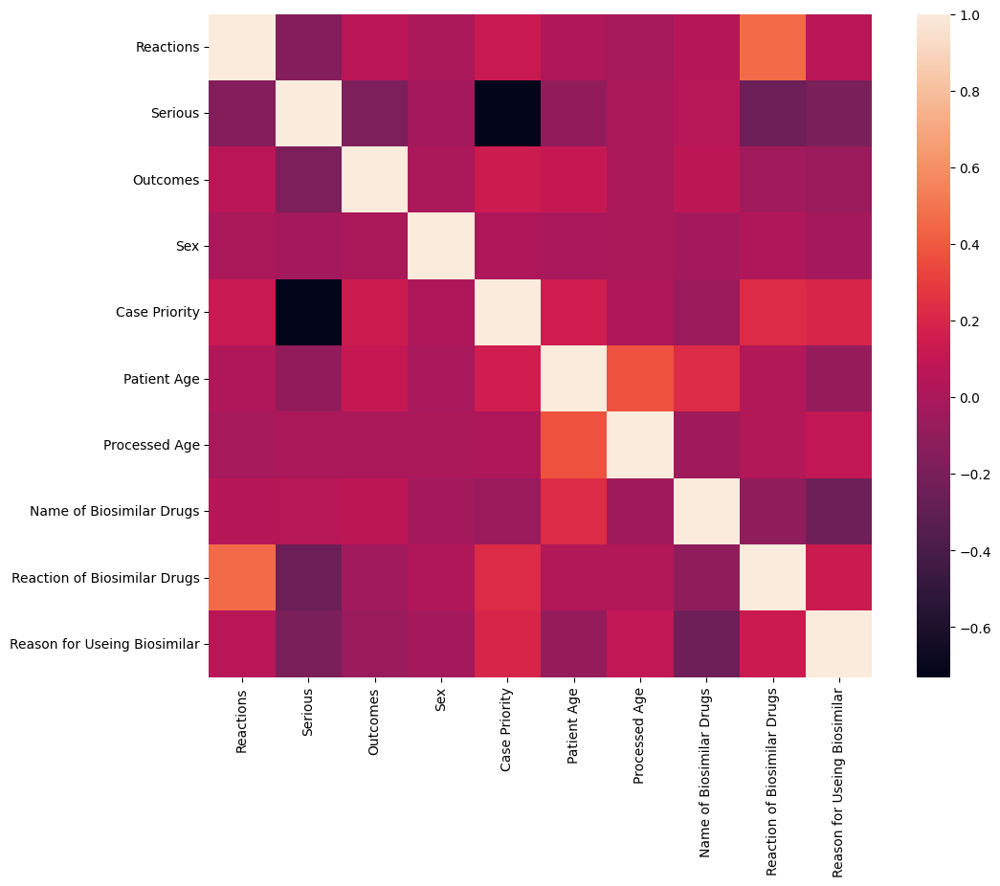

In [125]:
corrmat =Biosimilar.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=1,square=True);
plt.show()



In [126]:
X = Biosimilar[['Sex', 'Case Priority',
       'Patient Age', 'Processed Age', 'Name of Biosimilar Drugs',
       'Reason for Useing Biosimilar']]
y = Biosimilar['Serious']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)
y_pred_log_reg = log_reg.predict(X_test)

print("Logistic Regression Accuracy:", accuracy_score(y_test, y_pred_log_reg))



Logistic Regression Accuracy: 0.9634769905040176


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [127]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf.fit(X_train, y_train)
y_pred_rf = rf_clf.predict(X_test)

print("Random Forest Accuracy:", accuracy_score(y_test, y_pred_rf))

Random Forest Accuracy: 0.9668371073776479


In [128]:
import xgboost as xgb
from sklearn.metrics import accuracy_score

xgb_clf = xgb.XGBClassifier(random_state=42)
xgb_clf.fit(X_train, y_train)
y_pred_xgb = xgb_clf.predict(X_test)

print("XGBoost Accuracy:", accuracy_score(y_test, y_pred_xgb))

XGBoost Accuracy: 0.9671292914536158


In [129]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.metrics import accuracy_score

In [130]:
log_reg_param_grid = {
    'C': [0.1, 1, 10],
    'penalty': ['l2'],
    'solver': ['liblinear', 'saga']
}

In [131]:
rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
    }


In [132]:
xgb_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 6, 10],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}


In [133]:
log_reg_grid_search = GridSearchCV(LogisticRegression(), log_reg_param_grid, cv=5, n_jobs=-1, verbose=1)
log_reg_grid_search.fit(X_train, y_train)
print("Best parameters for Logistic Regression:", log_reg_grid_search.best_params_)
y_pred_log_reg = log_reg_grid_search.predict(X_test)
print("Logistic Regression Accuracy:", accuracy_score(y_test, y_pred_log_reg))


Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best parameters for Logistic Regression: {'C': 1, 'penalty': 'l2', 'solver': 'liblinear'}
Logistic Regression Accuracy: 0.9634769905040176


In [134]:
rf_grid_search = GridSearchCV(RandomForestClassifier(), rf_param_grid, cv=5, n_jobs=-1, verbose=1)
rf_grid_search.fit(X_train, y_train)
print("Best parameters for Random Forest:", rf_grid_search.best_params_)
y_pred_rf = rf_grid_search.predict(X_test)
print("Random Forest Accuracy:", accuracy_score(y_test, y_pred_rf))

Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best parameters for Random Forest: {'bootstrap': True, 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 200}
Random Forest Accuracy: 0.9668371073776479


In [135]:
xgb_grid_search = GridSearchCV(xgb.XGBClassifier(), xgb_param_grid, cv=5, n_jobs=-1, verbose=1)
xgb_grid_search.fit(X_train, y_train)
print("Best parameters for XGBoost:", xgb_grid_search.best_params_)
y_pred_xgb = xgb_grid_search.predict(X_test)
print("XGBoost Accuracy:", accuracy_score(y_test, y_pred_xgb))

Fitting 5 folds for each of 243 candidates, totalling 1215 fits
Best parameters for XGBoost: {'colsample_bytree': 0.9, 'learning_rate': 0.01, 'max_depth': 6, 'n_estimators': 300, 'subsample': 0.9}
XGBoost Accuracy: 0.966691015339664


In [136]:
from sklearn.metrics import classification_report

print("Logistic Regression Classification Report:")
print(classification_report(y_test, y_pred_log_reg))

print("Random Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))

print("XGBoost Classification Report:")
print(classification_report(y_test, y_pred_xgb))


Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.82      0.88      1118
           1       0.97      0.99      0.98      5727

    accuracy                           0.96      6845
   macro avg       0.96      0.91      0.93      6845
weighted avg       0.96      0.96      0.96      6845

Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.84      0.89      1118
           1       0.97      0.99      0.98      5727

    accuracy                           0.97      6845
   macro avg       0.96      0.92      0.94      6845
weighted avg       0.97      0.97      0.97      6845

XGBoost Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.84      0.89      1118
           1       0.97      0.99      0.98      5727

    accuracy                           0.97      6845
   macro avg     

In [137]:
mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
print(f"Mean Absolute Error (XGBoost): {mae_xgb}")

mae_rf = mean_absolute_error(y_test, y_pred_rf)
print(f"Mean Absolute Error (RandomForest): {mae_rf}")

mae_log = mean_absolute_error(y_test, y_pred_log_reg)
print(f"Mean Absolute Error (Logistic Regression): {mae_log}")

Mean Absolute Error (XGBoost): 0.033308984660336015
Mean Absolute Error (RandomForest): 0.03316289262235208
Mean Absolute Error (Logistic Regression): 0.036523009495982466


In [146]:
scaler = MinMaxScaler()
numeric_features = Biosimilar[['Patient Age', 'Processed Age']]
scaled_numeric_features = scaler.fit_transform(numeric_features)
categorical_features = ['Sex', 'Case Priority', 'Name of Biosimilar Drugs', 'Reason for Useing Biosimilar']
encoder = OneHotEncoder()
encoded_categorical_features = encoder.fit_transform(Biosimilar[categorical_features]).toarray()


In [147]:
outcomes_str = Biosimilar['Outcomes'].astype(str)
reactions_str = Biosimilar['Reaction Category'].astype(str)
mlb_outcome = MultiLabelBinarizer()
mlb_reaction = MultiLabelBinarizer()
outcome_encoded = mlb_outcome.fit_transform(outcomes_str.str.split(';'))
reaction_encoded = mlb_reaction.fit_transform(reactions_str.str.split(';'))

X = np.hstack([scaled_numeric_features, encoded_categorical_features])
y_outcome = outcome_encoded
y_reaction = reaction_encoded

In [148]:
X_train, X_test, y_train_outcome, y_test_outcome = train_test_split(X, y_outcome, test_size=0.2, random_state=42)
_, _, y_train_reaction, y_test_reaction = train_test_split(X, y_reaction, test_size=0.2, random_state=42)


In [149]:
input_layer = Input(shape=(X_train.shape[1],))
hidden_layer = Dense(128, activation='relu')(input_layer)
hidden_layer = Dense(64, activation='relu')(hidden_layer)
output_outcome = Dense(y_train_outcome.shape[1], activation='sigmoid', name='outcome_output')(hidden_layer)
output_reaction = Dense(y_train_reaction.shape[1], activation='sigmoid', name='reaction_output')(hidden_layer)
model = Model(inputs=input_layer, outputs=[output_outcome, output_reaction])
model.compile(
    optimizer='adam',
    loss={
        'outcome_output': 'binary_crossentropy',
        'reaction_output': 'binary_crossentropy',
    },
    metrics={
        'outcome_output': 'accuracy',
        'reaction_output': 'accuracy',
    }
)

model.summary()


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 1646)           │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_6 (Dense)           │ (None, 128)            │        210,816 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_7 (Dense)           │ (None, 64)             │          8,256 │ dense_6[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ outcome_output (Dense)    │ (None, 619)            │         40,235 │ dense_7[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reaction_output (Dense)   │ (None, 1)              │             65 │ dense_7[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 259,372 (1013.17 KB)

 Trainable params: 259,372 (1013.17 KB)

 Non-trainable params: 0 (0.00 B)

In [150]:
history = model.fit(
    X_train,
    {'outcome_output': y_train_outcome, 'reaction_output': y_train_reaction},
    validation_split=0.2,
    epochs=50,
    batch_size=32,
    verbose=1
)


Epoch 1/50
685/685 ━━━━━━━━━━━━━━━━━━━━ 12s 10ms/step - loss: 0.2015 - outcome_output_accuracy: 0.4345 - outcome_output_loss: 0.1397 - reaction_output_accuracy: 1.0000 - reaction_output_loss: 0.0617 - val_loss: 0.0040 - val_outcome_output_accuracy: 0.6318 - val_outcome_output_loss: 0.0040 - val_reaction_output_accuracy: 1.0000 - val_reaction_output_loss: 1.3292e-08
Epoch 2/50
685/685 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0039 - outcome_output_accuracy: 0.6397 - outcome_output_loss: 0.0039 - reaction_output_accuracy: 1.0000 - reaction_output_loss: 1.2106e-08 - val_loss: 0.0038 - val_outcome_output_accuracy: 0.6368 - val_outcome_output_loss: 0.0038 - val_reaction_output_accuracy: 1.0000 - val_reaction_output_loss: 1.6714e-08
Epoch 3/50
685/685 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0037 - outcome_output_accuracy: 0.6469 - outcome_output_loss: 0.0037 - reaction_output_accuracy: 1.0000 - reaction_output_loss: 1.9269e-08 - val_loss: 0.0037 - val_outcome_output_accuracy: 0.6368 - va

In [143]:
results = model.evaluate(
    X_test,
    {'outcome_output': y_test_outcome, 'reaction_output': y_test_reaction}
)

print("Test Loss and Accuracy for Outcomes:", results[:2])
print("Test Loss and Accuracy for Reactions:", results[2:])


214/214 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0050 - outcome_output_accuracy: 0.6547 - outcome_output_loss: 0.0044 - reaction_output_accuracy: 0.1889 - reaction_output_loss: 5.4074e-04
Test Loss and Accuracy for Outcomes: [0.0051255603320896626, 0.004584222566336393]
Test Loss and Accuracy for Reactions: [0.0005418374203145504, 0.6401752829551697, 0.1872899979352951]


In [144]:
utcome_probs, reaction_probs = model.predict(X_test)
print("Predicted Outcome Probabilities:", outcome_probs[0])
print("Predicted Reaction Probabilities:", reaction_probs[0])
threshold = 0.5
predicted_outcomes = (outcome_probs > threshold).astype(int)
predicted_reactions = (reaction_probs > threshold).astype(int)
print("Predicted Outcome Labels:", predicted_outcomes[0])
print("Predicted Reaction Labels:", predicted_reactions[0])


214/214 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Predicted Outcome Probabilities: [1.42023555e-06 4.75848125e-08 4.54029071e-11 1.97356531e-08
 1.22568744e-09 1.95750204e-11 4.66424623e-08 3.12602721e-11
 2.98136733e-08 3.34021621e-07 2.23525092e-08 2.28021179e-07
 1.40632153e-03 1.27137025e-11 3.76870126e-08 5.89330017e-13
 1.60064217e-09 3.34651556e-12 3.36944517e-08 3.21100729e-10
 2.93538505e-09 2.50291823e-08 4.12218490e-08 4.87108853e-10
 6.55440008e-11 5.09658461e-11 1.07949927e-09 3.48710785e-08
 1.20680301e-08 1.41383511e-11 2.28721886e-09 1.52740454e-09
 2.95883942e-11 7.89705337e-06 1.43599088e-14 6.74309817e-08
 1.46771831e-11 1.32796130e-09 1.09260059e-10 2.54671811e-10
 7.80607863e-08 1.97650073e-11 1.85239184e-08 1.75072323e-03
 9.92852241e-12 3.77824492e-08 2.07453282e-12 7.47334486e-12
 8.98967793e-12 2.58520538e-10 1.31842626e-07 5.77322967e-10
 2.15415508e-08 2.83899851e-07 3.28087459e-08 9.18826126e-10
 8.70298638e-14 1.05592262e-11 1.89710574e-11 1.40383365e-11
 1.12224726